# Dimensionality reduction on the EB time course

In [ ]:
!pip install scprep phate umap-learn

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.manifold import TSNE
import phate
# import umap
import scprep
import os

# Embryoid body dataset

### Time course of human embryoid body differentiation

Low passage H1 hESCs were maintained on Matrigel-coated dishes in DMEM/F12-N2B27 media supplemented with FGF2. 

For EB formation, cells were treated with Dispase, dissociated into small clumps and plated in non-adherent plates in media supplemented with 20% FBS, which was prescreened for EB differentiation. 

Samples were collected during 3-day intervals during **a 27 day-long differentiation timecourse.**

An undifferentiated hESC sample was also included (Figure S7D). Induction of key germ layer markers in these EB cultures was validated by qPCR (data not shown). 

For single cell analyses, EB cultures were dissociated, FACS sorted to remove doublets and dead cells and processed on a 10x genomics instrument to generate cDNA libraries, which were then sequenced. 

Small scale sequencing determined that we have successfully collected data on approximately 31,000 cells equally distributed throughout the timecourse.


## load data

### Download 10X Data from Mendeley Datasets

The EB dataset is publically available as `scRNAseq.zip` at Mendelay Datasets at <https://data.mendeley.com/datasets/v6n743h5ng/>. 

Inside the scRNAseq folder, there are five subdirectories, and in each subdirectory are three files: `barcodes.tsv`, `genes.tsv`, and `matrix.mtx`. For more information about how CellRanger produces these files, check out the [Gene-Barcode Matrices Documentation](https://support.10xgenomics.com/single-cell-gene-expression/software/pipelines/latest/output/matrices).

Here's the directory structure:
```
download_path
└── scRNAseq
    ├── scRNAseq.zip
    ├── T0_1A
    │   ├── barcodes.tsv
    │   ├── genes.tsv
    │   └── matrix.mtx
    ├── T2_3B
    │   ├── barcodes.tsv
    │   ├── genes.tsv
    │   └── matrix.mtx
    ├── T4_5C
    │   ├── barcodes.tsv
    │   ├── genes.tsv
    │   └── matrix.mtx
    ├── T6_7D
    │   ├── barcodes.tsv
    │   ├── genes.tsv
    │   └── matrix.mtx
    └── T8_9E
        ├── barcodes.tsv
        ├── genes.tsv
        └── matrix.mtx
```

### import 10 X data into Pandas DataFrames by `scprep.load_10X`

`scprep` is a toolkit for loading and manipulating single-cell data. 

The function `load_10X` will automatically load 3 matrices of 10X scRNAseq datasets (and others) into a Pandas DataFrame that we can use for preprocessing, visualization, and analysis.

**Parameters**

- `sparse`: By default `sparse=True`, `scprep.io.load_10X` loads scRNA-seq data using the Pandas SparseDataFrame [(**see Pandas docs**)](https://pandas.pydata.org/pandas-docs/stable/sparse.html) to maximize memory efficiency. 

    However, this will be slower than loading on a dense matrix. 

    To load a dense matrix, pass the `sparse=False` argument to `load_10X`. 

- `gene_labels = 'both'`: we can see the gene symbols while still retaining the uniqueness offered by gene IDs.

download_path = '/Users/wenxinxu/Desktop/CPSC553/data/'
sparse=True
T1 = scprep.io.load_10X(os.path.join(download_path, "scRNAseq", "T0_1A"), sparse=sparse, gene_labels='both')
T2 = scprep.io.load_10X(os.path.join(download_path, "scRNAseq", "T2_3B"), sparse=sparse, gene_labels='both')
T3 = scprep.io.load_10X(os.path.join(download_path, "scRNAseq", "T4_5C"), sparse=sparse, gene_labels='both')
T4 = scprep.io.load_10X(os.path.join(download_path, "scRNAseq", "T6_7D"), sparse=sparse, gene_labels='both')
T5 = scprep.io.load_10X(os.path.join(download_path, "scRNAseq", "T8_9E"), sparse=sparse, gene_labels='both')

In [ ]:

T1.head()

,RP11-34P13.3 (ENSG00000243485),FAM138A (ENSG00000237613),OR4F5 (ENSG00000186092),RP11-34P13.7 (ENSG00000238009),RP11-34P13.8 (ENSG00000239945),RP11-34P13.14 (ENSG00000239906),RP11-34P13.9 (ENSG00000241599),FO538757.3 (ENSG00000279928),FO538757.2 (ENSG00000279457),AP006222.2 (ENSG00000228463),...,AC007325.2 (ENSG00000277196),BX072566.1 (ENSG00000277630),AL354822.1 (ENSG00000278384),AC023491.2 (ENSG00000278633),AC004556.1 (ENSG00000276345),AC233755.2 (ENSG00000277856),AC233755.1 (ENSG00000275063),AC240274.1 (ENSG00000271254),AC213203.1 (ENSG00000277475),FAM231B (ENSG00000268674)
0,,,,,,,,,,,,,,,,,,,,,
AAACATACCAGAGG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACATTGAAAGCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACATTGAAGTGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACATTGGAGGTG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACATTGGTTTCT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Library size filtering

We filter out cells that have either very large or very small library sizes. 

For this data set, library size correlates somewhat with sample and so we filter on a per-sample basis. 

we eliminate the top and bottom 20% of cells for each sample. 

Similar results are obtained with simpler, less conservative filtering.

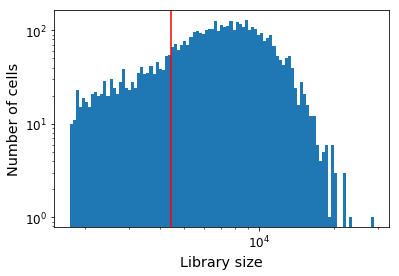

In [ ]:
scprep.plot.plot_library_size(T1, percentile=20)

In [ ]:
filtered_batches = []
for batch in [T1, T2, T3, T4, T5]:
    batch = scprep.filter.filter_library_size(batch, percentile=20, keep_cells='above')
    batch = scprep.filter.filter_library_size(batch, percentile=75, keep_cells='below')
    filtered_batches.append(batch)
# del T1, T2, T3, T4, T5 # removes objects from memory

### Merge all datasets into a dataframe and create a label representing the time point of each sample

In [ ]:
EBT_counts, sample_labels = scprep.utils.combine_batches(
    filtered_batches, 
    ["Day 00-03", "Day 06-09", "Day 12-15", "Day 18-21", "Day 24-27"],
    append_to_cell_names=True
)
# del filtered_batches # removes objects from memory
EBT_counts.head()

,RP11-34P13.3 (ENSG00000243485),FAM138A (ENSG00000237613),OR4F5 (ENSG00000186092),RP11-34P13.7 (ENSG00000238009),RP11-34P13.8 (ENSG00000239945),RP11-34P13.14 (ENSG00000239906),RP11-34P13.9 (ENSG00000241599),FO538757.3 (ENSG00000279928),FO538757.2 (ENSG00000279457),AP006222.2 (ENSG00000228463),...,AC007325.2 (ENSG00000277196),BX072566.1 (ENSG00000277630),AL354822.1 (ENSG00000278384),AC023491.2 (ENSG00000278633),AC004556.1 (ENSG00000276345),AC233755.2 (ENSG00000277856),AC233755.1 (ENSG00000275063),AC240274.1 (ENSG00000271254),AC213203.1 (ENSG00000277475),FAM231B (ENSG00000268674)
AAACATTGAAAGCA-1_Day 00-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCGTGCAGAAA-1_Day 00-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCGTGGAAGGC-1_Day 00-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACGCACCGGTAT-1_Day 00-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACGCACCTATTC-1_Day 00-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Preprocessing: Filtering, Normalizing, and Transforming

### Filtering

We filter the data by: 

1. Filtering by library size (if we did not do this prior to combining batches)

2. Removing genes that are expressed in relatively few cells.

3. Removing dead cells

We filter dead cells after library size normalization, since library size is not necessarily related to cell state.

#### Filtering I: Library size filtering

We did this before when combining batches, because the library size correlated strongly with our samples. 

However, if we wanted to do something simplier, we could have run the following here instead:

In [ ]:
EBT_counts, sample_labels = scprep.filter.library_size_filter(EBT_counts, sample_labels, cutoff=2000)

#### Filtering II: Remove rare genes

We eliminate genes that are expressed in 10 cells or fewer.

In [ ]:
EBT_counts = scprep.filter.filter_rare_genes(EBT_counts, min_cells=10)

#### Filtering III: Dead cell removal

Dead cells are likely to have a higher mitochondrial RNA expression level than live cells. Therefore, we remove suspected dead cells by eliminating cells that have the highest mitochondrial RNA expression levels on average.  

First let's look at the distribution of mitochontrial genes.

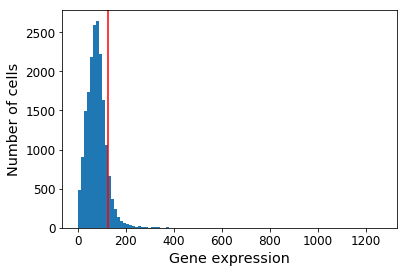

In [ ]:
mito_genes = scprep.select.get_gene_set(EBT_counts, starts_with="MT-") # Get all mitochondrial genes. There are 14, FYI.
scprep.plot.plot_gene_set_expression(EBT_counts, genes=mito_genes, percentile=90)

Here we see that above the top 90th percentile, there is a steep increase in expression of mitochondrial RNAs. We'll remove these cells from further analysis.

In [ ]:
EBT_counts, sample_labels = scprep.filter.filter_gene_set_expression(
    EBT_counts, sample_labels, genes=mito_genes, 
    percentile=90, keep_cells='below')

### Normalization

To correct for differences in library sizes, we divide each cell by its library size and then rescale by the median library size.

In python this is performed using the preprocessing method `scprep.normalize.library_size_normalize()`.

In [ ]:
EBT_counts = scprep.normalize.library_size_normalize(EBT_counts)

### Transformation

In scRNA-seq analysis, the data is often $\log$-transformed. 

This typically requires the addition of some small value to avoid taking $\log(0)$. 

We avoid this issue entirely by instead taking the square root transform. 

The square root function has a similar form as the $\log$ function with the added benefit of being stable at 0.

In [ ]:
EBT_counts = scprep.transform.sqrt(EBT_counts)

## save proprocessed data to pickle

In [ ]:
EBT_counts.to_pickle("/Users/wenxinxu/Desktop/CPSC553/data/EmbryoidBody/data.pkl") 
sample_labels.to_pickle("/Users/wenxinxu/Desktop/CPSC553/data/EmbryoidBody/metadata.pkl") 

# Load preprocessed data

- data: rows are single cells, columns are genes (name: "A1BG", ID: "ENSG00000121410")

- metadata: 'sample labels", time point

In [3]:
data = pd.read_pickle("/Users/wenxinxu/Desktop/CPSC553/data/EmbryoidBody/data.pkl") 
metadata = pd.read_pickle("/Users/wenxinxu/Desktop/CPSC553/data/EmbryoidBody/metadata.pkl")

In [4]:
data.head()

,A1BG (ENSG00000121410),A1BG-AS1 (ENSG00000268895),A2M (ENSG00000175899),A2M-AS1 (ENSG00000245105),A2ML1 (ENSG00000166535),A4GALT (ENSG00000128274),AAAS (ENSG00000094914),AACS (ENSG00000081760),AADAT (ENSG00000109576),AAED1 (ENSG00000158122),...,ZWILCH (ENSG00000174442),ZWINT (ENSG00000122952),ZXDA (ENSG00000198205),ZXDB (ENSG00000198455),ZXDC (ENSG00000070476),ZYG11A (ENSG00000203995),ZYG11B (ENSG00000162378),ZYX (ENSG00000159840),ZZEF1 (ENSG00000074755),ZZZ3 (ENSG00000036549)
AAACCGTGCAGAAA-1_Day 00-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0
AAACGCACCGGTAT-1_Day 00-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.022861,0.000000,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0
AAACGCACCTATTC-1_Day 00-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,1.112210,0.0,0.0,0.0,0.0,0.0,1.11221,0.0,0.0
AAAGATCTCTGCTC-1_Day 00-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,1.352958,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0
AAAGATCTGGTACT-1_Day 00-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0


In [5]:
metadata.head()

AAACCGTGCAGAAA-1_Day 00-03    Day 00-03
AAACGCACCGGTAT-1_Day 00-03    Day 00-03
AAACGCACCTATTC-1_Day 00-03    Day 00-03
AAAGATCTCTGCTC-1_Day 00-03    Day 00-03
AAAGATCTGGTACT-1_Day 00-03    Day 00-03
Name: sample_labels, dtype: object

# Visualization using Principle Components Analysis (PCA)

Here we're going to use the simplest dimensionality reduction method first. We don't expect PCA to work well because the dataset is so complex, but it's a good place to start with any dataset.

## Run PCA on EB data

In [6]:
data_pca = scprep.reduce.pca(data, n_components=200, method='dense')

In [7]:
data_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC191,PC192,PC193,PC194,PC195,PC196,PC197,PC198,PC199,PC200
AAACCGTGCAGAAA-1_Day 00-03,-13.560929,-0.921068,-1.208261,-1.800791,-2.847307,-8.003966,-1.409536,-0.485193,-2.988016,0.410723,...,0.744350,-0.153838,0.079396,-1.304927,-0.163947,-0.051753,1.175904,1.350435,1.211276,1.300924
AAACGCACCGGTAT-1_Day 00-03,-17.618502,-5.046129,8.482871,6.261483,0.704355,0.218840,6.662709,-5.927561,-1.825076,-5.664574,...,0.681395,-0.594840,-0.215054,0.424473,-1.349880,0.214896,-0.047098,-0.690586,0.081403,0.124731
AAACGCACCTATTC-1_Day 00-03,-20.466943,-5.589348,12.443613,4.101338,-4.646395,0.403011,5.209842,-3.231079,-2.005835,-5.001727,...,0.712499,0.684962,0.815593,-0.256024,-0.979369,-0.285060,0.544503,0.687856,0.468118,0.858941
AAAGATCTCTGCTC-1_Day 00-03,-13.146052,2.724009,-0.544312,-0.286840,1.334922,-10.621273,-1.718045,-0.391454,-2.739358,1.478737,...,-1.265724,0.491843,0.219959,0.428128,0.514803,1.541564,-0.175656,0.469531,0.281222,-0.168512
AAAGATCTGGTACT-1_Day 00-03,-17.608200,-4.953107,7.756518,4.996509,-3.235164,1.406031,3.135314,-3.936344,-2.884965,-5.271721,...,0.388730,0.231453,-0.662935,-0.022434,1.133859,-0.673785,0.330088,0.345187,-1.630440,0.517881


## Plot PCs colored by time

The scprep package has a number of handy plotting features that act as a wrapper to `matplotlib`. You should know how to use `matplotlib` for more complicated plotting, but you can make all the plots we need in this tutorial with some help from `scprep`.

The full documentaiton of `scprep.plot` can be found here:

https://scprep.readthedocs.io/en/stable/reference.html#module-scprep.plot

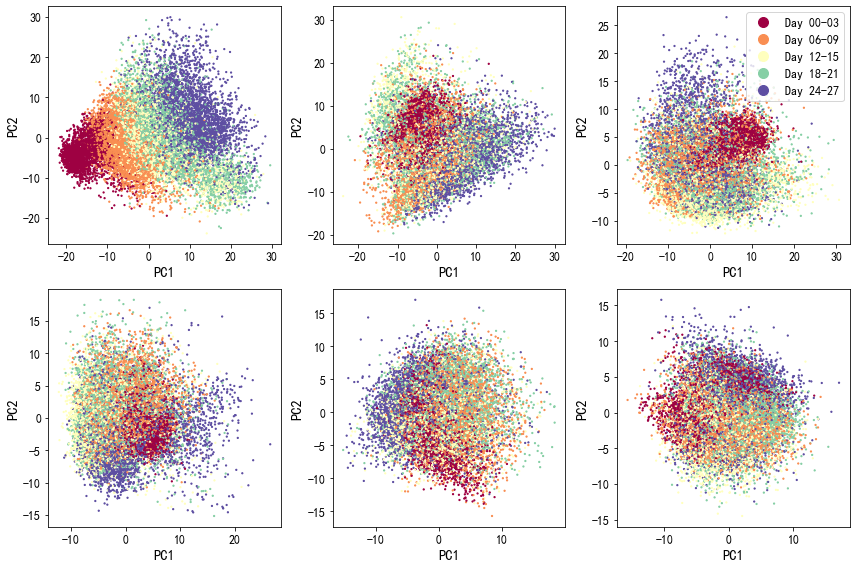

In [9]:
# Create a figure (the background) and a set of axes (the things we plot on)
fig, axes = plt.subplots(2,3, figsize=(12,8))
# This makes it easier to iterate through the axes
axes = axes.flatten()

for i, ax in enumerate(axes):
    legend = True if i == 2 else False # only plot a legend on one axis
    scprep.plot.scatter(data_pca.iloc[:,i], data_pca.iloc[:,i+1], c=metadata,
                        cmap='Spectral', ax=ax,
                        label_prefix="PC", legend=legend)
fig.tight_layout()

## Plot expression of a gene on the first two PCs

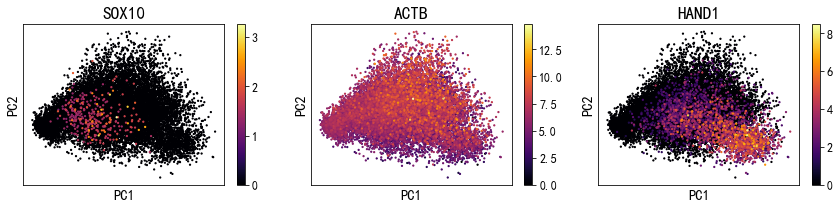

In [13]:
genes = ['SOX10', 'ACTB', 'HAND1']

fig, axes = plt.subplots(1, len(genes), figsize=(12,3))
axes = axes.flatten()  # This makes it easier to iterate through the axes

for i, (ax, gene) in enumerate(zip(axes, genes)):
    expression = scprep.select.select_cols(data, starts_with=gene)
    sort_index = expression.sort_values().index # sort cells by maximum expression so we can see where the gene is expressed
    scprep.plot.scatter2d(data_pca.loc[sort_index], c=expression.loc[sort_index], shuffle=False,
                     title=gene, ticks=None, label_prefix='PC', ax=ax)
fig.tight_layout()

### Discussion

1. What do you notice? What does the first principle component track with? What about the second? What do you think the higher PCs represent? What does that mean?

    The first principal components tracks with sample time. The second expands as sample time increases, indicating some kind of cellular heterogeneity marker.

    Higher PCs are likely to represent specific differences between cell types.

2. Why did we plot gene expression on the first two PCs?

    The first two PCs represents the highest level structure of the data, so gene expression plotted on this gives us a broad understanding of what's happening in the data. The genes allows us to characterize each part of the manifold.

3. Look up the function of these genes. What do you notice about where these genes are expressed? What does it mean when a gene is expressed everywhere vs. in one region?

    If a gene is expressed everywhere, it is likely some kind of housekeeping gene. indeed, Beta-actin is a part of the cell cytoskeleton and is expressed in all human cells.
    
    If a gene is only expression in one region, it's likely to be cell-type specific, like HAND1 which is a heart / neural crest marker.

# t-SNE

## hyperparameters: perplexity and learning rate

In 2016, a group from Google Brain published great essay in Distill about ["How to Use t-SNE Effectively"](https://distill.pub/2016/misread-tsne/). In the article, they provide an interactive tool to explore the effect of various hyperparameters of t-SNE on various datasets.

There are two main hyperparameters for t-SNE: **perplexity** and **learning rate**

- Perplexity determines the "neighborhood size". Larger values of perplexity increase the number of points within the neighborhood. The recommended range of t-SNE perplexity is roughly 5-50. 

- Learning rate:sometimes called epsilon, affects how quickly the algorithm "stablilizes". 

you can find the t-SNE operator at sklearn manifold learning algorithm [`sklearn.manifold.TNSE`](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html).

We create a t-SNE operator and run it on data just like the PCA operator

In [ ]:
from sklearn.manifold import TSNE
tsne_op = TSNE(n_components=2, perplexity=30)
data_tsne = tsne_op.fit_transform(data)

### Discussion

- pros and cons of tSNE. 

    Pros: shows good separation between cell types.

    Cons: slow, global position of clusters is meaningless.


- recommendations for hyparameters

    run multiple times to account for random initialization. 

    Try different values of `perplexity` (between 5 and 100) and different number of PCs (between 20 and 200).

## Run t-SNE on EB data

run TSNE on the EB dataset, it should take 3-5 minutes. 

### change perplexity

### change the number of first PCs

using the first 5, 20, 200 PC components to speed up the run time and seeing how this affects output and think why

### plot first two t-SNEs colored by time

/opt/anaconda3/envs/d2l/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/opt/anaconda3/envs/d2l/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/opt/anaconda3/envs/d2l/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/opt/anaconda3/envs/d2l/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/opt/anaconda3/envs/d2l/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/opt/anaconda3/envs/d2l/lib/python3.

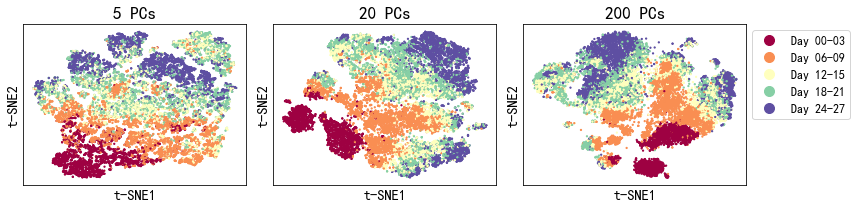

In [16]:
num_PCs = [5, 20, 200]  # number of first PC
perplexity = 30

tsne_op = TSNE(n_components=2, perplexity=perplexity) # Fitting tSNE. Change the perplexity here.

fig, axes = plt.subplots(1, len(num_PCs), figsize=(12,3))
axes = axes.flatten()  # This makes it easier to iterate through the axes

for i, (ax, num_PC) in enumerate(zip(axes, num_PCs)):
    legend = True if i == 2 else False # only plot a legend on one axis
    data_tsne = tsne_op.fit_transform(data_pca.iloc[:,: num_PC])

    data_tsne = pd.DataFrame(data_tsne, index=data.index) # Put output into a dataframe
    scprep.plot.scatter2d(data_tsne, c=metadata, cmap='Spectral', 
                      ticks=False, label_prefix='t-SNE', title=f"{num_PC} PCs", legend=legend,
                      legend_anchor=(1,1), ax=ax)
fig.tight_layout()
    

### Discussion

1. What are the differences you see?

    With more PCs, the dataset effectively has retained more components of the data. 
    
    As we increase the number of PCs, the t-SNE plot shows more and more separation between groups of cells.


2. Try running t-SNE with the same parameters twice. What happens? Why?

    The cluster placement moves around a lot. 
    
    This is because t-SNE is randomly initialized each time, and global distances are not considered in the algorithm, so the placement of clusters relative to one another doesn't matter at all.

## Plot expression of gene on first two t-SNE components

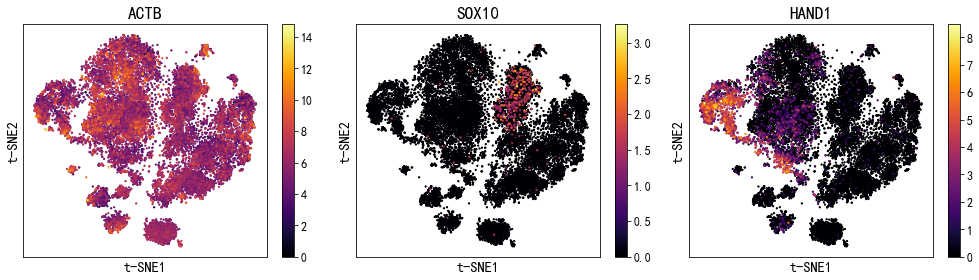

In [17]:
tsne_op = TSNE(n_components=2, perplexity=30)
data_tsne = tsne_op.fit_transform(data_pca.iloc[:,:5])
data_tsne = pd.DataFrame(data_tsne, index=data.index)
genes = ['ACTB', 'SOX10', 'HAND1']

fig, axes = plt.subplots(1,3, figsize=(14,4))
axes = axes.flatten()

for gene, ax in zip(genes, axes):
    expression = scprep.select.select_cols(data, exact_word=gene)
    
    sort_index = expression.sort_values().index
    
    scprep.plot.scatter2d(data_tsne.loc[sort_index], c=expression.loc[sort_index], shuffle=False,
                         title=gene, ticks=None, label_prefix='t-SNE', ax=ax)
    
fig.tight_layout()

# UMAP

The syntax for UMAP is identical to t-SNE: `umap.UMAP().fit_transform`. 

UMAP is relatively fast, so you won't need to use the subsampled data.

UMAP's `n_neighbors` parameter describes the size of the neighborhood around each point. (2 - 200)

The `min_dist` parameter describes how tightly points can be packed together. (0 - 0.99)

Try a range of different values in and outside of these ranges and discuss the results

## plot first 2 UMAPs colored by time

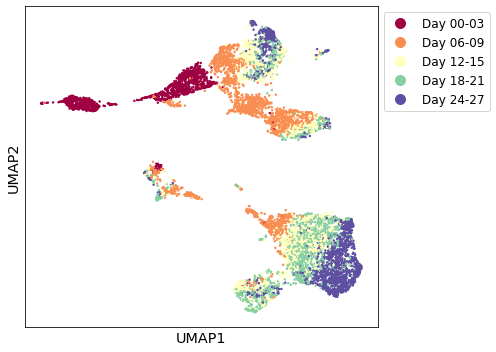

In [ ]:
data_umap = umap.UMAP(n_neighbors=15, min_dist=0.1).fit_transform(data_pca.iloc[:,:50])
data_umap = pd.DataFrame(data_umap, index = data.index)
# plot the UMAP coordinates colored by time point
scprep.plot.scatter2d(data_umap, c=metadata, cmap='Spectral', 
                      ticks=False, label_prefix='UMAP',
                      legend_anchor=(1,1), figsize=(7,5))

## Plot gene expression on first two UMAP components

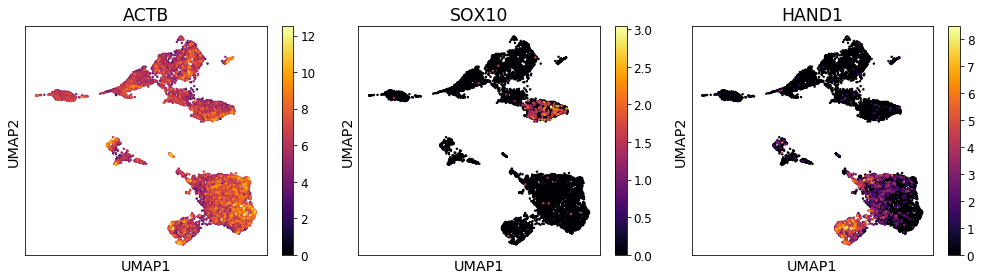

In [ ]:
data_umap = umap.UMAP(n_neighbors=15, min_dist=0.1).fit_transform(data_pca.iloc[:,:50])
data_umap = pd.DataFrame(data_umap, index = data.index)
genes = ['ACTB', 'SOX10', 'HAND1']

fig, axes = plt.subplots(1,3, figsize=(14,4))
axes = axes.flatten()

for gene, ax in zip(genes, axes.flatten()):
    expression = scprep.select.select_cols(data, exact_word=gene)
    sort_index = expression.sort_values().index
    scprep.plot.scatter2d(data_umap.loc[sort_index], c=expression.loc[sort_index], shuffle=False,
                         title=gene, ticks=None, label_prefix='UMAP', ax=ax) # coloring by gene expression
fig.tight_layout()

### Discussion

1. What are the similarities and differences between UMAP and t-SNE? 

    Both UMAP and t-SNE form coherent clusters of the data, and both have some randomness in their output. 

    However, UMAP is much more stable, and seems to retain some global structure. 

    UMAP also tends to plot points more densely with more white space between clusters.

2. Do you notice any parameter choices that seem to have similar effects between the algorithms?

    `n_neighbors` (UMAP) and `perplexity` (t-SNE)

# PHATE

## How does PHATE work?

PHATE is a dimensionaltiy reduction developed by the Krishnaswamy lab for visualizing high-dimensional data. 

We use PHATE for *every* dataset the comes through the lab: scRNA-seq, CyTOF, gut microbiome profiles, simulated data, etc. 

PHATE was designed to handle noisy, non-linear relationships between data points. 

PHATE produces a low-dimensional representation that preserves both local and global structure in a dataset so that you can make generate hypotheses from the plot about the relationships between cells present in a dataset. 

Although PHATE has utility for analysis of many data modalities, we will focus on the application of PHATE for scRNA-seq analysis.

PHATE is inspired by diffusion maps [(Coifman et al. 2008.)](https://doi.org/10.1016/j.acha.2006.04.006), but include several key innovations that make it possible to generate a two or three dimensional visualization that preserves continuous relationships between cells where they exist. 

For a full explanation of the PHATE algorithm, please consult [the PHATE manuscript](https://doi.org/10.1101/120378).

## Using the PHATE estimator

The API of PHATE mimics that of Scikit Learn. 

First, you instantiate a PHATE estimator object with the parameters for fitting the PHATE embedding to a given dataset. 

Next, you use the `fit` and `fit_transform` functions to generate an embedding. 

For more information, check out [**the PHATE readthedocs page**](http://phate.readthedocs.io/).

PHATE has it's own set of hyperparameters. 

Changing the parameters will greatly change the output of the algorithm. 

We reccomend starting with the defaults, then change `knn` and `decay` according the reccomendations below. 

Generally, we won't select `t` ourselves, but if you're tuning hyperparameters, it's best to fix `t`.

* `knn` : Number of nearest neighbors (default: 5). decrease `knn` to 3 or 4 if you're looking for subtle structure. increase `knn`  (e.g. to 20) if sample size is large, e.g. > 100k cells or if your PHATE embedding appears very disconnected.


* `decay` : Alpha decay (default: 15). Decreasing `a` increases connectivity on the graph, increasing `a` decreases connectivity. This rarely needs to be tuned. Set it to `None` for a k-nearest neighbors kernel.

* `t` : Number of times to power the operator (default: 'auto'). This is equivalent to the amount of smoothing done to the data. It is chosen automatically by default, but you can increase it if your embedding lacks structure, or decrease it if the structure looks too compact.

* `gamma` : Informational distance constant (default: 1). `gamma=1` gives the PHATE log potential, but other informational distances can be interesting. If most of the points seem concentrated in one section of the plot, you can try `gamma=0`.

## Run PHATE on EB data

Here's the simplest way to apply PHATE. Running this should take ~1-3 minutes.

In [18]:
phate_op = phate.PHATE(n_components=2, knn=5, decay=15, t='auto', gamma=1)

data_phate = phate_op.fit_transform(data_pca.iloc[:,:50])
data_phate = pd.DataFrame(data_phate, index=data.index)

Calculating PHATE...
  Running PHATE on 16821 observations and 50 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 8.71 seconds.
    Calculating affinities...
    Calculated affinities in 6.48 seconds.
  Calculated graph and diffusion operator in 15.24 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 1.86 seconds.
    Calculating KMeans...
    Calculated KMeans in 8.93 seconds.
  Calculated landmark operator in 11.94 seconds.
  Calculating optimal t...
    Automatically selected t = 21
  Calculated optimal t in 5.08 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 1.42 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 3.69 seconds.
Calculated PHATE in 37.39 seconds.


### plot first two PHATE components colored by time

/opt/anaconda3/envs/d2l/lib/python3.8/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


<AxesSubplot:xlabel='PHATE1', ylabel='PHATE2'>

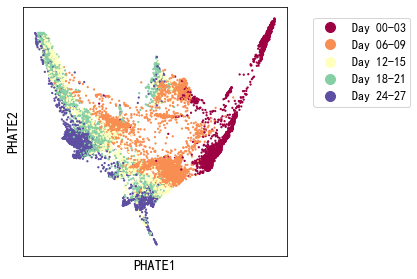

In [27]:
scprep.plot.scatter2d(data_phate, c=metadata, figsize=(6,4), cmap="Spectral",
                      ticks=False, label_prefix="PHATE", legend_loc=(1.1, 0.6))

### plot first three PHATE components colored by time (visualize in 3D)

/opt/anaconda3/envs/d2l/lib/python3.8/site-packages/scprep/plot/utils.py:104: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


<Axes3DSubplot:xlabel='PHATE1', ylabel='PHATE2'>

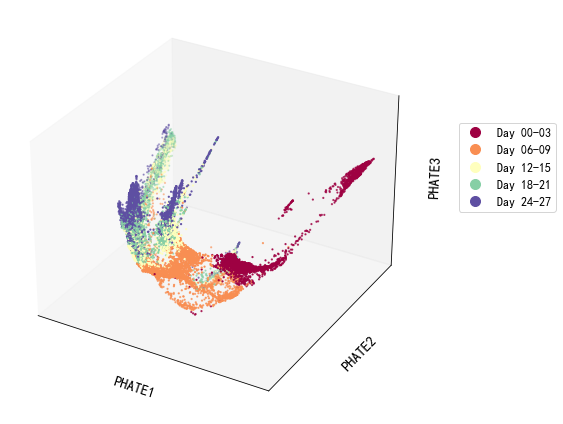

In [37]:
data_phate = phate_op.set_params(n_components=3).transform()

scprep.plot.scatter3d(data_phate, c=metadata, figsize=(8,6), cmap="Spectral",
                      ticks=False, label_prefix="PHATE", legend_loc=(1.1, 0.5))

### rotating 3D plot.

In [40]:

scprep.plot.rotate_scatter3d(data_phate, c=metadata, 
                             figsize=(8,6), cmap="Spectral",
                             ticks=False, label_prefix="PHATE", legend_anchor=(1,1))

### plot gene expression on first two PHATE components

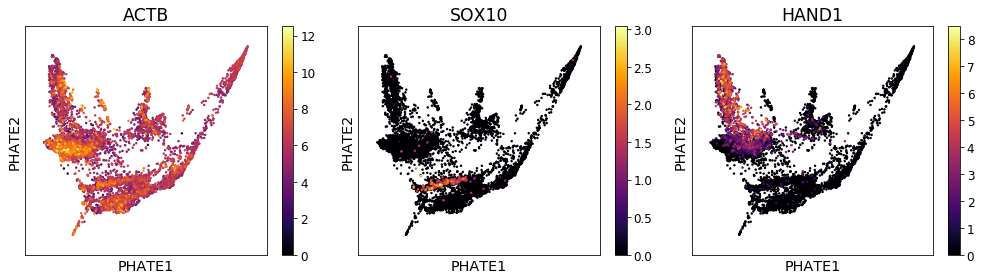

In [ ]:

genes = ['ACTB', 'SOX10', 'HAND1']
fig, axes = plt.subplots(1,3, figsize=(14,4))
axes = axes.flatten()

for gene, ax in zip(genes, axes.flatten()):
    expression = scprep.select.select_cols(data, exact_word=gene)
    
    sort_index = expression.sort_values().index
    
    scprep.plot.scatter2d(data_phate.loc[sort_index], c=expression.loc[sort_index], shuffle=False,
                         title=gene, ticks=None, label_prefix='PHATE', ax=ax)

fig.tight_layout()

# Compare non-linear dimensionality reduction algorithms

1. In a dataset with trajectories, how well does each method perform?

PHATE is the only one of these three methods which reliably retains trajectory-like structure. 

t-SNE and UMAP tend to break them into clusters, though UMAP less so than t-SNE.

2. Now that you've seen all the methods, how might you include them in a workflow?

    **It makes sense to do both PHATE and UMAP alongside one another.**

    If you can identify similar structures in both, the structures are likely real since the methods are so different!

3. What are the advantages of each method?

    UMAP and t-SNE do well to show cluster structures. 

    PHATE does well to show continuous structures. 

    UMAP and t-SNE show the number of points in each cluster / region, while PHATE shows much more clearly the heterogeneity of regions but doesn't obviously show the number of points.

    UMAP and PHATE are fast.


4. If you didn't know if your data contained clusters or trajectories, what would you do?

    Run PHATE and UMAP together!